In [2]:
from fullwaveqc import tools, geom, siganalysis, inversion, visual
import numpy as np
import matplotlib.pyplot as plt
import copy
import warnings

warnings.filterwarnings("ignore")
%reload_ext autoreload
plt.rcParams.update({'font.size': 18})

In [3]:
path    = "/geophysics2/dpelacani/PROJECTS/DDMON25_18/"
shot_no = 200                    # for amplitude plotting
x_list  = [6000, 9000]           # for vp-well plotting

# The true model

In [4]:
TRUE_MON = tools.load("/geophysics2/dpelacani/true_models/Monitor/TRUE_enl_Vp_mon_y6250.sgy", model=True, verbose=1)
TRUE_MON.dx=2.


2019-08-22 13:46:53.852031 	 Opening file /geophysics2/dpelacani/true_models/Monitor/TRUE_enl_Vp_mon_y6250.sgy...
2019-08-22 13:46:53.862321 	 Reading model...
2019-08-22 13:46:54.282135 	 Successfully loaded model of size 2500 x 8245!

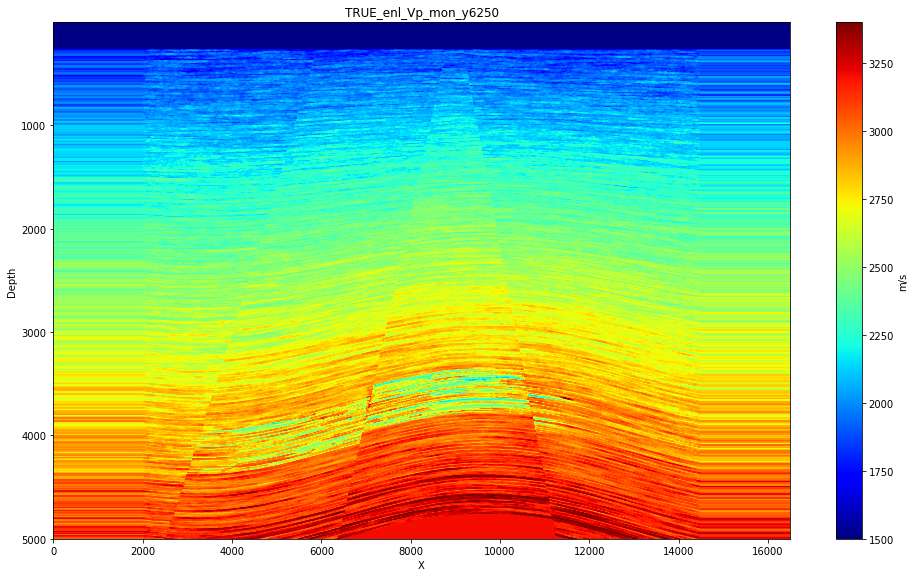

In [4]:
# Visualise true model
visual.vpmodel(TRUE_MON, vmin=1500, vmax=3400)

In [8]:
print(TRUE_MON.attr())

{'name': 'TRUE_enl_Vp_mon_y6250', '_type': 'model', 'filepath': '/geophysics2/dpelacani/true_models/Monitor/TRUE_enl_Vp_mon_y6250.sgy', 'dx': 2.0, 'nx': 8245, 'nz': 2500, 'minvp': 1500.0, 'maxvp': 3687.6812, 'data': array([[3023.0723, 3023.0723, 3023.0723, ..., 3141.815 , 3141.815 ,
        3141.815 ],
       [3022.6118, 3022.6118, 3022.6118, ..., 3167.3213, 3167.3213,
        3167.3213],
       [3023.3853, 3023.3853, 3023.3853, ..., 3195.5962, 3195.5962,
        3195.5962],
       ...,
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ]], dtype=float32)}


# The starting model


2019-08-14 10:10:24.962924 	 Opening file /geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-StartVp.sgy...
2019-08-14 10:10:24.975020 	 Reading model...
2019-08-14 10:10:24.982490 	 Successfully loaded model of size 201 x 661!{'name': 'DDMON25_18-StartVp', '_type': 'model', 'filepath': '/geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-StartVp.sgy', 'dx': 25, 'nx': 661, 'nz': 201, 'minvp': 1500.0, 'maxvp': 3346.0657, 'data': array([[3183.0173, 3182.973 , 3182.9333, ..., 3183.1885, 3183.199 ,
        3183.2297],
       [3181.7305, 3181.656 , 3181.592 , ..., 3182.1025, 3182.0862,
        3182.08  ],
       [3179.3208, 3179.262 , 3179.209 , ..., 3179.989 , 3179.952 ,
        3179.9136],
       ...,
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ],
       [1500.    , 1500.    , 1500.    , ..., 1500.    , 1500.    ,
        1500.    ]], dtype=float32)}


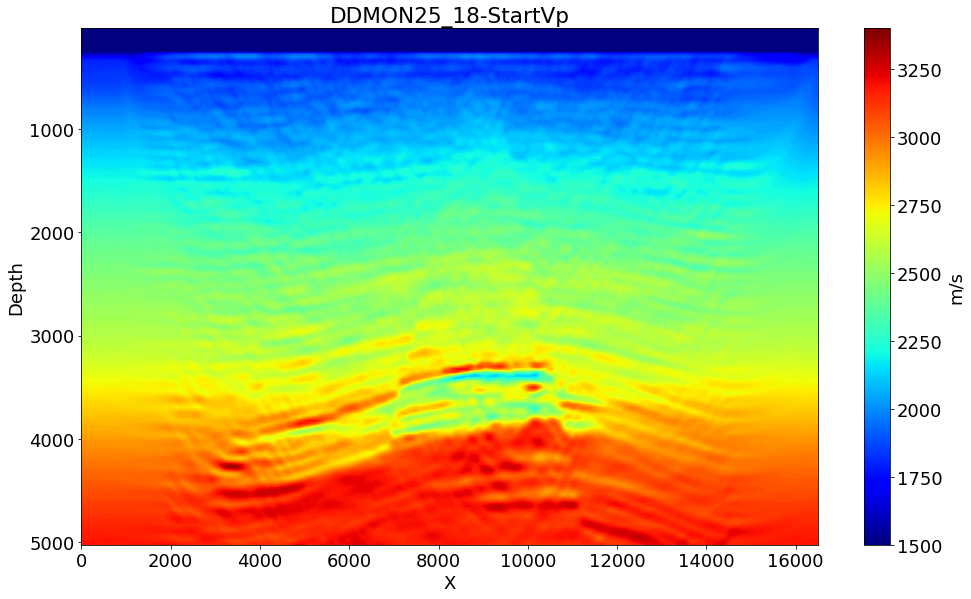

In [9]:
# Iteration 130 from PARBASE25_18
start_model_path = path + "DDMON25_18-StartVp.sgy"
START_MODEL = tools.load(start_model_path, model=True)
print(START_MODEL.attr())
START_MODEL.dx = 25.
visual.vpmodel(START_MODEL, vmin=1500, vmax=3400, cap=0.0, units="m/s", save=False)

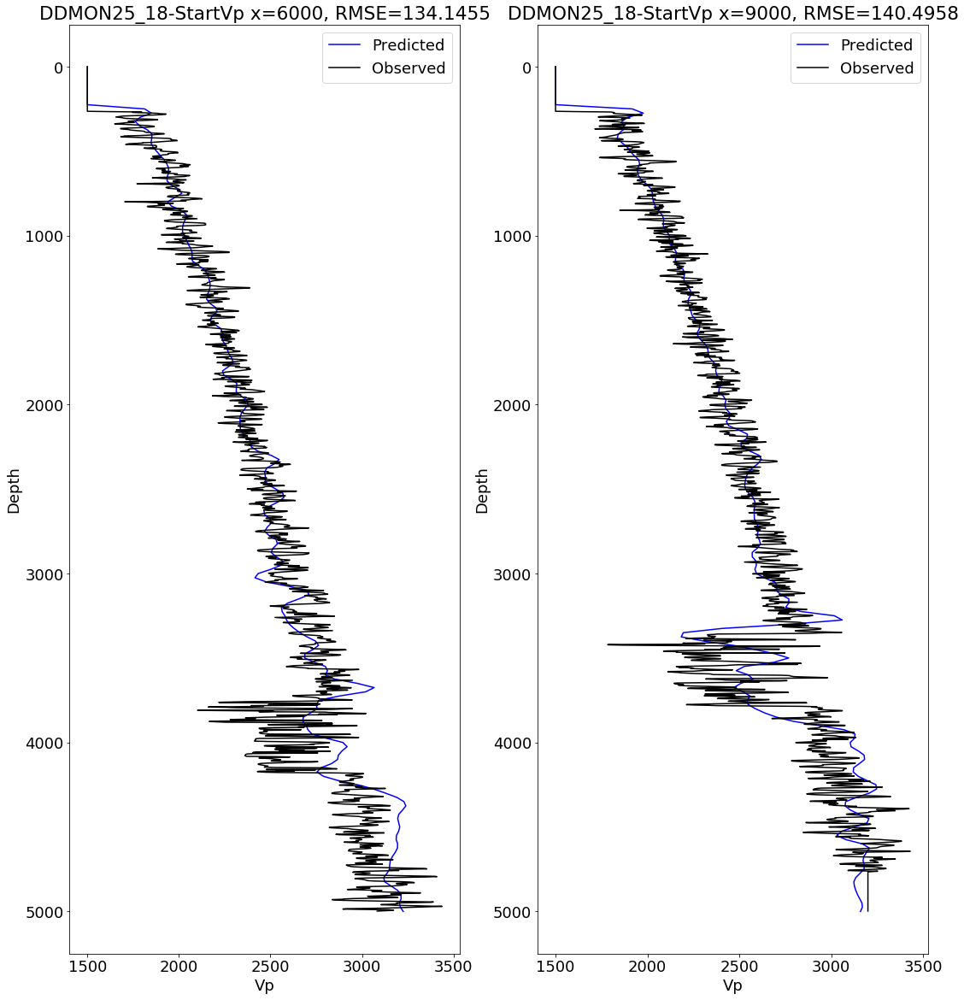

In [10]:
# Plot Vp logs of predicted and true models
wells_start = visual.vpwell(START_MODEL, pos_x=x_list, TrueModel=TRUE_MON, plot=True)

# Create de Double Difference Monitor Dataset

In [11]:
# Load observed monitor data
OBS_MON_DATA0 = tools.load("/geophysics2/dpelacani/PROJECTS/PARMON25_18/PARMON25_18-Observed.sgy", model=False, verbose=1)


2019-08-14 10:10:52.013720 	 Opening file /geophysics2/dpelacani/PROJECTS/PARMON25_18/PARMON25_18-Observed.sgy...
2019-08-14 10:10:52.034349 	 Loading data...
2019-08-14 10:11:56.045278 	 521 shots found. Loading headers...
2019-08-14 10:13:26.893010 	 322149 total traces read
2019-08-14 10:13:26.893336 	 Data loaded successfully

In [12]:
# Load observed baseline data
OBS_BASE_DATA = tools.load("/geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-Observed.sgy", model=False, verbose=1)


2019-08-14 10:13:28.488671 	 Opening file /geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-Observed.sgy...
2019-08-14 10:13:28.491284 	 Loading data...
2019-08-14 10:14:38.591924 	 521 shots found. Loading headers...
2019-08-14 10:16:46.739700 	 322149 total traces read
2019-08-14 10:16:46.740062 	 Data loaded successfully

In [15]:
# Load predicted baseline data (forward modelling of the Iter 130 of PARBASE25_18, made in synthetic run PARBASE25FORALL_18)
PRD_BASE_DATA = tools.load("/geophysics2/dpelacani/PROJECTS/PARBASE25FORALL_18/PARBASE25FORALL_18-Synthetic.sgy", model=False, verbose=1)


2019-08-14 10:21:08.112199 	 Opening file /geophysics2/dpelacani/PROJECTS/PARBASE25FORALL_18/PARBASE25FORALL_18-Synthetic.sgy...
2019-08-14 10:21:08.157112 	 Loading data...
2019-08-14 10:22:16.306023 	 521 shots found. Loading headers...
2019-08-14 10:23:46.833012 	 322149 total traces read
2019-08-14 10:23:46.833359 	 Data loaded successfully

In [16]:
# Create the DD dataset
save_path = "/geophysics2/dpelacani/PROJECTS/DDDATASET_18/"
_ = tools.ddwi(OBS_MON_DATA0, OBS_BASE_DATA, PRD_BASE_DATA, normalise=True, name="DDDATASET_18", 
               mon_filepath=OBS_MON_DATA0.filepath, save=True, save_path=save_path, verbose=1)


2019-08-14 10:24:36.854132 	 All shots normalised..2019-08-14 10:24:33.115266 	 Normalising shot 0
2019-08-14 10:24:36.854151 	 Computing double difference ...
2019-08-14 10:25:29.951540 	 Double difference dataset calculated successfully!
2019-08-14 10:25:29.955894 	 Reading file /geophysics2/dpelacani/PROJECTS/PARMON25_18/PARMON25_18-Observed.sgy...
2019-08-14 10:25:29.956022 	 Creating new file  at /geophysics2/dpelacani/PROJECTS/DDDATASET_18/DDDATASET_18.sgy...
2019-08-14 10:30:34.686723 	 Stacking data ...
2019-08-14 10:41:20.799389 	 Updating traces ...
2019-08-14 10:42:30.621177 	 Double difference dataset saved!

In [17]:
# Load DDMON dataset
DD_MON_DATA = tools.load("/geophysics2/dpelacani/PROJECTS/DDDATASET_18/DDDATASET_18.sgy", model=False, verbose=1)


2019-08-14 10:42:31.815418 	 Opening file /geophysics2/dpelacani/PROJECTS/DDDATASET_18/DDDATASET_18.sgy...
2019-08-14 10:42:31.830601 	 Loading data...
2019-08-14 10:43:23.045854 	 521 shots found. Loading headers...
2019-08-14 10:44:37.057964 	 322149 total traces read
2019-08-14 10:44:37.058222 	 Data loaded successfully

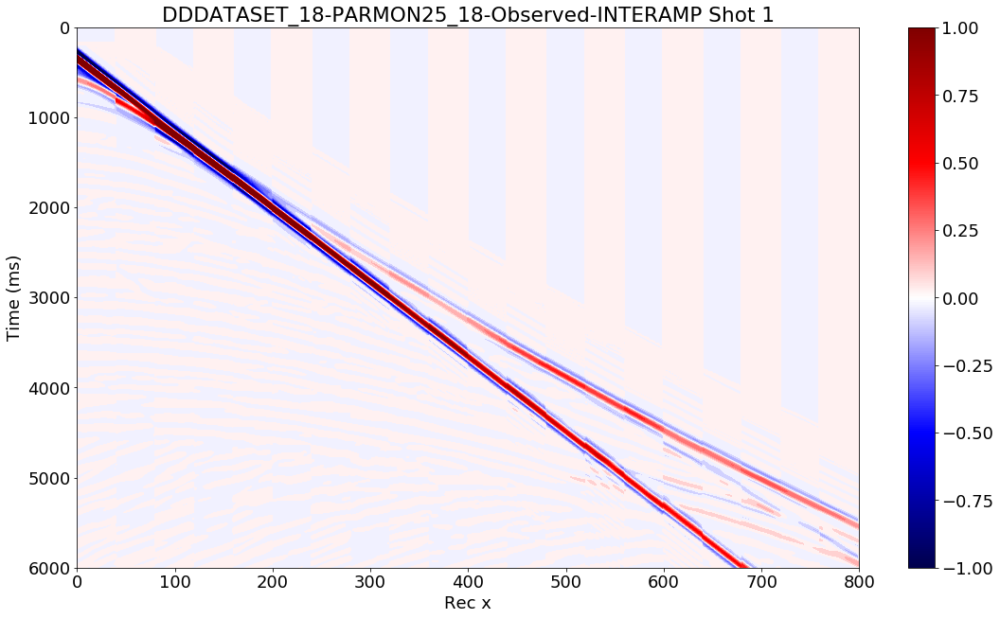

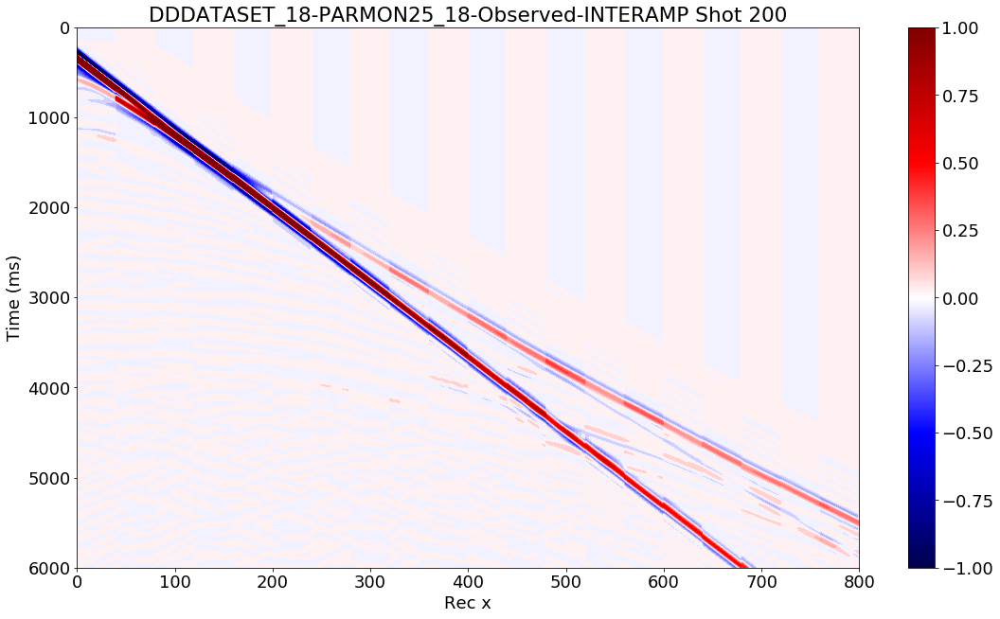

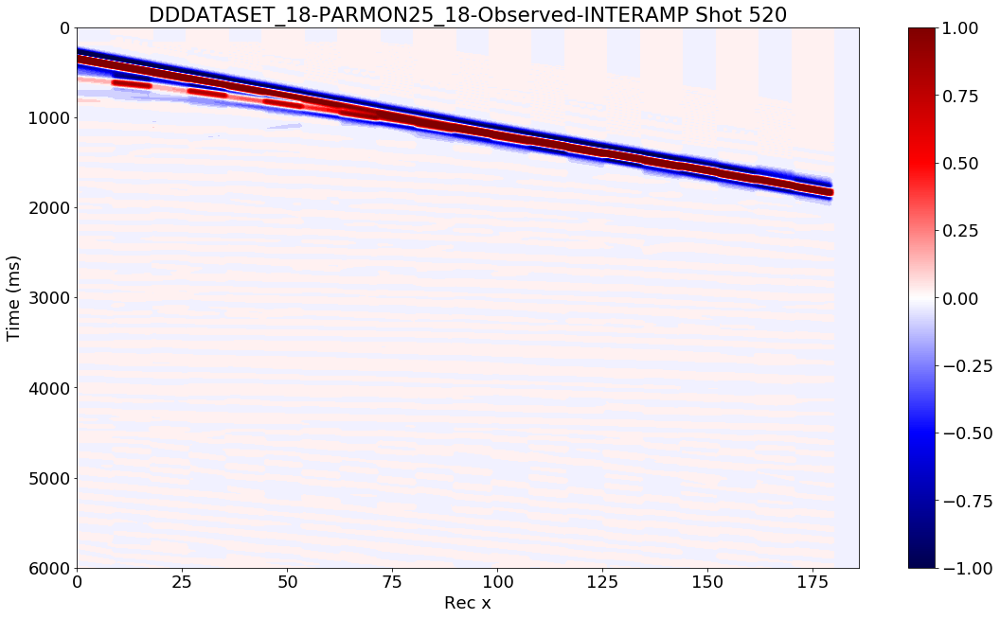

In [23]:
# Compare to OBS_MON_DATA to check DDMON is okay
visual.interamp(OBS_MON_DATA0, DD_MON_DATA, shot=  1, n_blocks=20, vmin=-1, vmax=1)
visual.interamp(OBS_MON_DATA0, DD_MON_DATA, shot=200, n_blocks=20, vmin=-1, vmax=1)
visual.interamp(OBS_MON_DATA0, DD_MON_DATA, shot=520, n_blocks=20, vmin=-1, vmax=1)

# Boundary Calculation and QC on SegyPrep Alignment

In [19]:
# Calculating number of absorbing boundarie cells and number of cells required 
# to distance the source from the absorbing boundaries
n_abs, n_dist = geom.boundarycalc(d=190, dx=25., fmin=3., vmax=3700)
print("Number of absorbing boundary cells   : ", n_abs)
print("Number of cells from source (Fresnel): ", n_dist)

Number of absorbing boundary cells   :  99
Number of cells from source (Fresnel):  10


2019-08-14 11:08:20.561554 	                          Plotting ...     

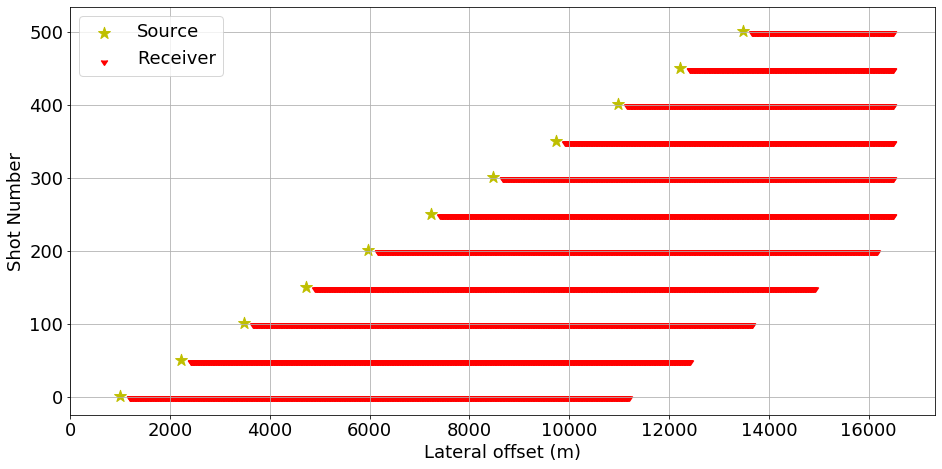

11


In [20]:
# Visualising (some) sources and receivers positions as understood from segyprep
rcvgeopath = path + "DDMON25_18-Receivers.geo"
srcgeopath = path + "DDMON25_18-Sources.geo"
src_list=[i for i in range(0, 521, 50)]
# src_list=[]
print(len(geom.surveygeom(rcvgeopath, srcgeopath, src_list, plot=True, verbose=1)[1]))

# Observed (DDMON) Data (with +2ms delay)

In [21]:
OBS_MON_DATA = tools.load(path+"DDMON25_18-Observed.sgy", model=False, verbose=1)


2019-08-14 11:08:31.533600 	 Opening file /geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-Observed.sgy...
2019-08-14 11:08:31.549775 	 Loading data...
2019-08-14 11:09:49.488672 	 521 shots found. Loading headers...
2019-08-14 11:11:17.132847 	 322149 total traces read
2019-08-14 11:11:17.133175 	 Data loaded successfully

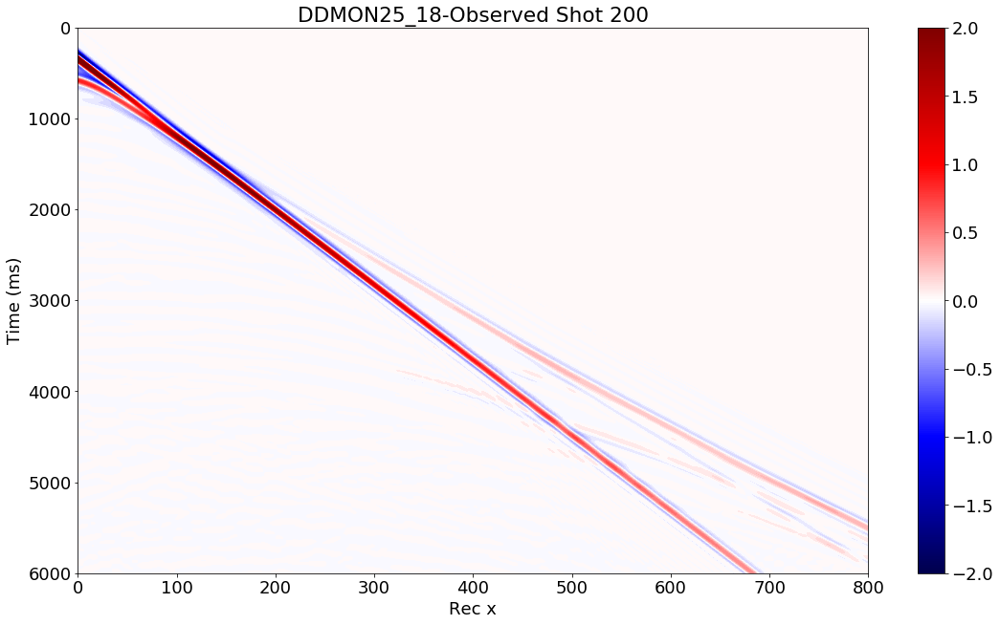

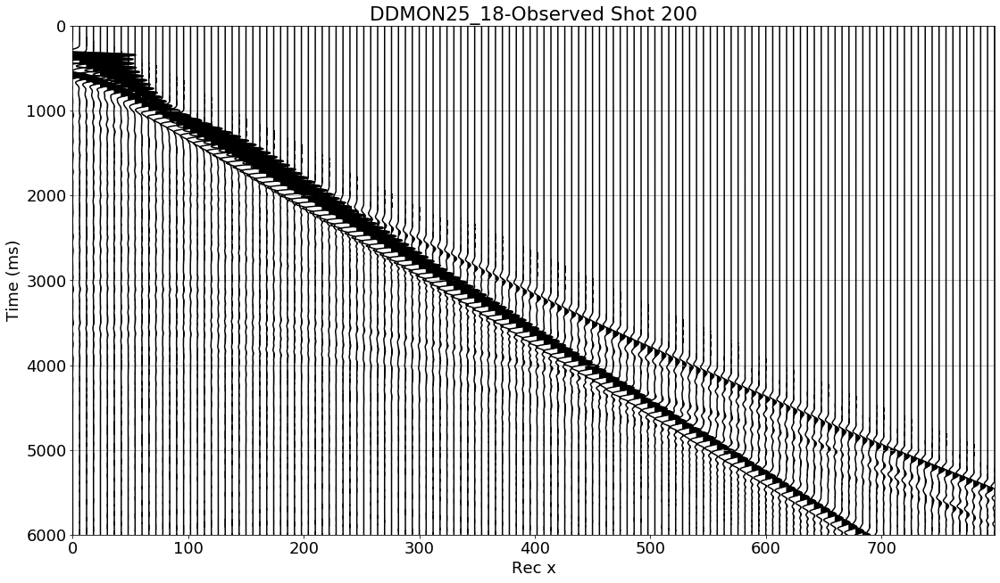

In [22]:
visual.amplitude(OBS_MON_DATA, shot=shot_no, vmin=-1, vmax=1)
visual.wiggle(OBS_MON_DATA, shot=shot_no, scale=14.5, skip_trace=5)

2019-08-10 13:59:00.321312 	 Sampling Frequency = 500.0000 Hz

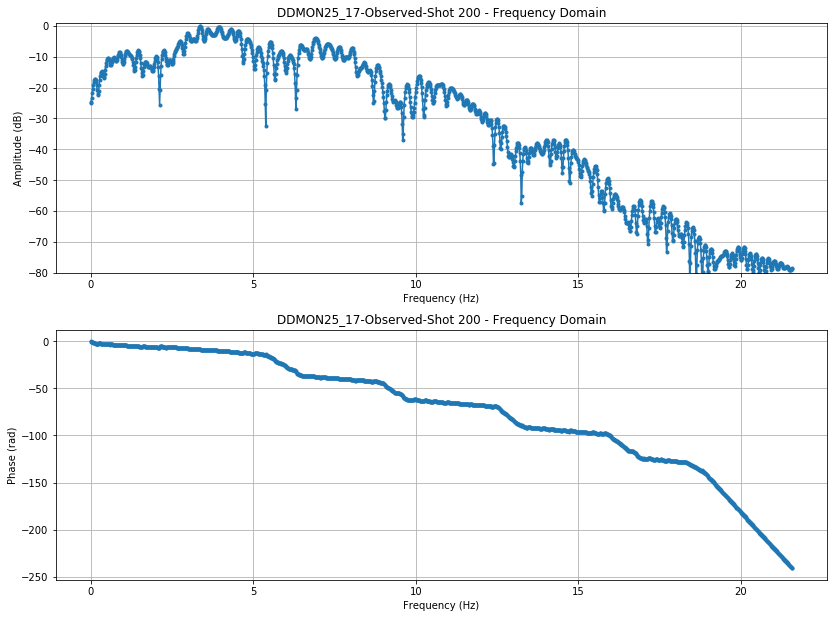

In [52]:
obs_spec = siganalysis.dataspec(OBS_MON_DATA, shot=shot_no, ms=True, fmax=18, plot=True, fft_smooth=10)

# The wavelet


2019-08-14 11:13:09.144715 	 Opening file /geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-Signature.sgy...
2019-08-14 11:13:09.149000 	 Loading data...
2019-08-14 11:13:09.202492 	 1 shots found. Loading headers...
2019-08-14 11:13:09.204928 	 521 total traces read
2019-08-14 11:13:09.205097 	 Data loaded successfully
2019-08-14 11:13:09.206171 	 Sampling Frequency = 500.0000 Hz

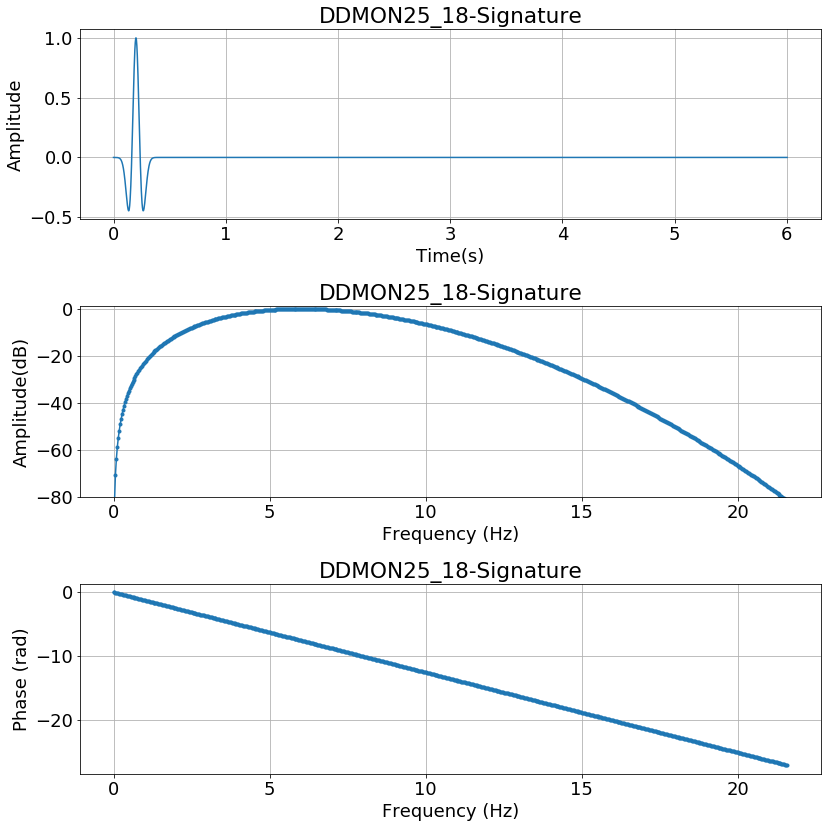

In [24]:
wavelet_path = path + "DDMON25_18-Signature.sgy"
WAVELET = tools.load(wavelet_path, model=False)
# print("\n\n", WAVELET.attr(), "\n\n")
WAVELET.samples = [3001]
WAVELET.dt = [2.]
wavelet = siganalysis.wavespec(WAVELET, ms=True, fmax=18, plot=True, fft_smooth=5)

# The inverted model (DDMON25_18)

In [33]:
it=130

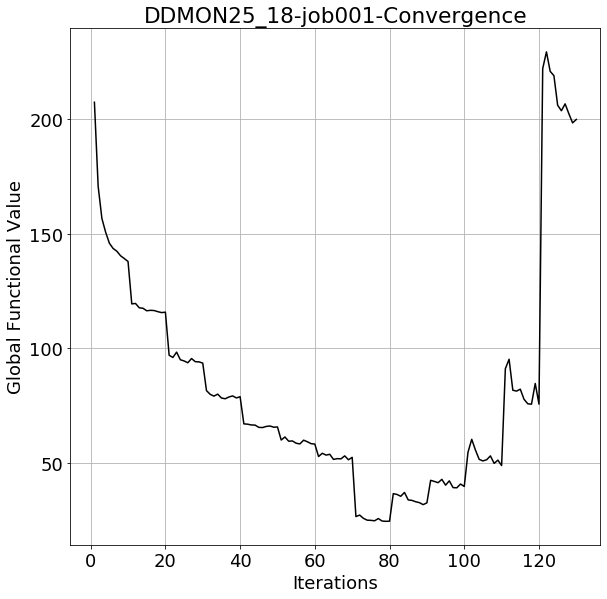

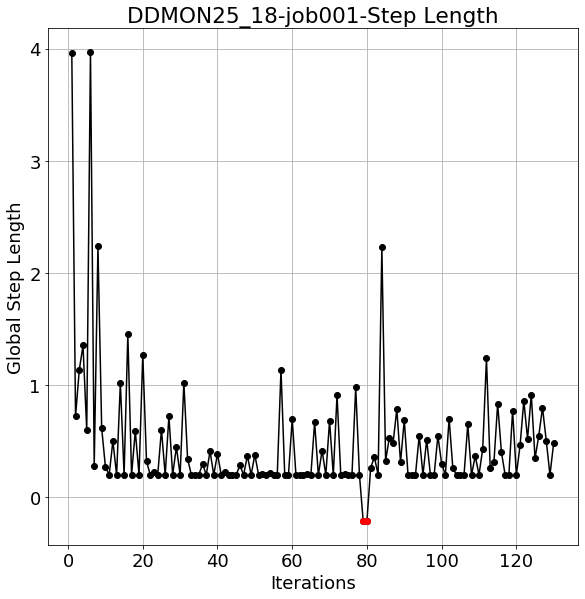

In [34]:
# We have a look here at the functional and step lengths of the monitor inversion. However, it is not very
# useful to compare it to the functional and step length evolution of the PARBASE25_18 inversion because 
# DDMON25_18 is automatically constrained by it. Whilst PARBASE25_18 has functional values of 2^4 DDMON25_18
# has functional values of 2^2 becasue the starting model is already a good match to what Fullwave3D reads
# as the observed dataset
job_path = "/geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-job001.log"
_ = inversion.functional(job_path, plot=True)
_ = inversion.steplen(job_path, plot=True)


2019-08-14 16:12:49.181926 	 Opening file /geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-CP00130-Vp.sgy...
2019-08-14 16:12:49.184054 	 Reading model...
2019-08-14 16:12:49.192036 	 Successfully loaded model of size 201 x 661!

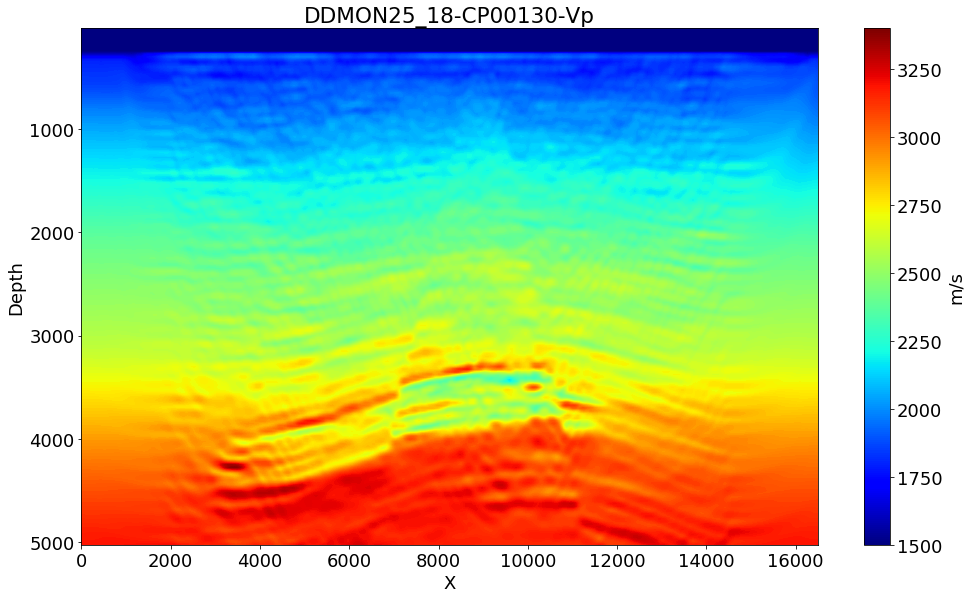

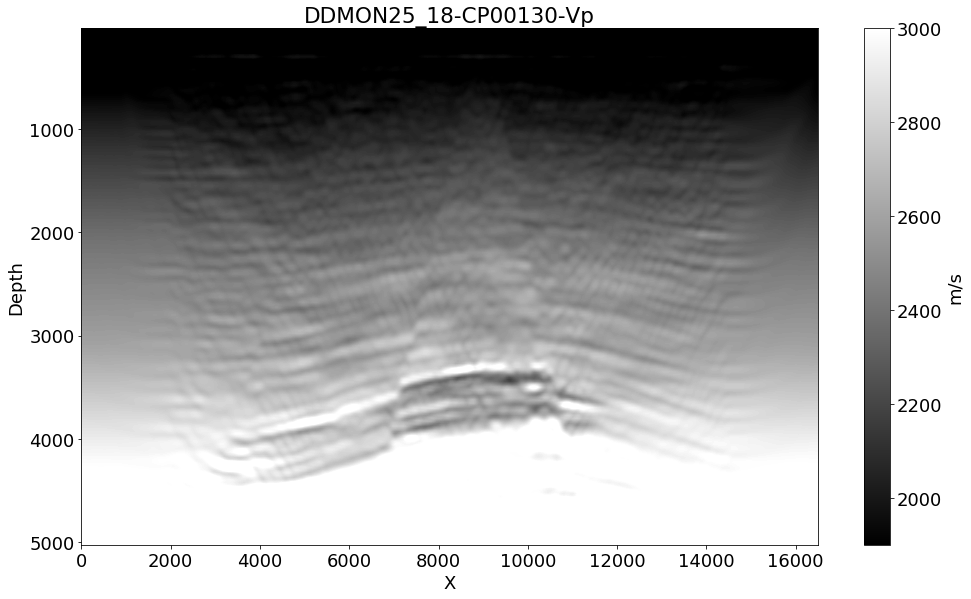

In [35]:
model_path = path + "DDMON25_18-CP"+format(it, "05")+"-Vp.sgy"
DD18 = tools.load(model_path, model=True, verbose=1)
visual.vpmodel(DD18, vmin=1500, vmax=3400)
visual.vpmodel(DD18, vmin=1900, vmax=3000, cmap="gray")

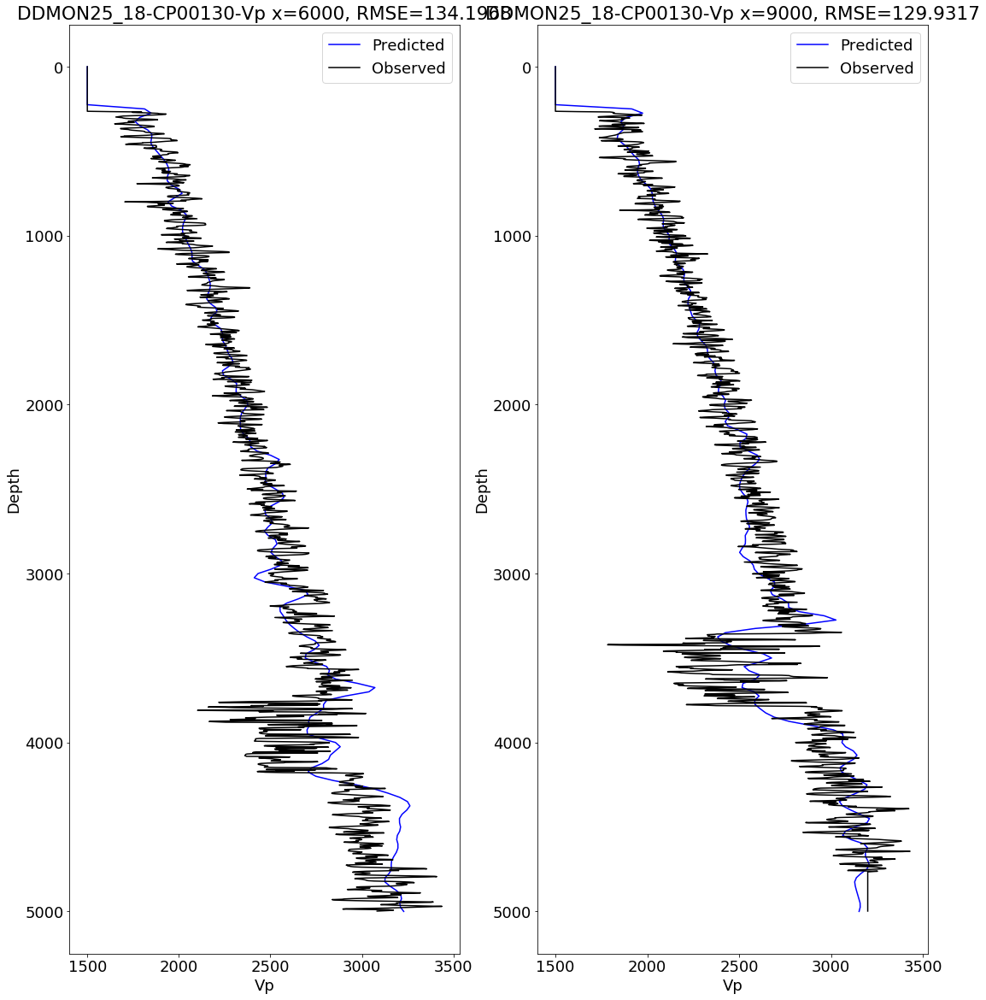

In [36]:
# Plot Vp logs of predicted and true models
wells_cp = visual.vpwell(DD18, pos_x=x_list, TrueModel=TRUE_MON, plot=True)

In [31]:
visual.animateinv(it_max=it, path="/geophysics2/dpelacani/PROJECTS/DDMON25_18/", project_name="DDMON25_18", vmin=1500, vmax=3400, verbose=1)

2019-08-14 15:12:32.247486 	 Loading model 110 ...
2019-08-14 15:12:32.247541 	 Creating animation...

# Double Difference (DDDIFF25_18)

In [10]:
TRUE_BASE = tools.load("/geophysics2/dpelacani/true_models/Base/TRUE_enl_Vp_bl_y6250.sgy", model=True, verbose=1)
TRUE_BASE.dx = 2.
TRUE_DIFF = copy.deepcopy(TRUE_MON)
TRUE_DIFF.name = "TRUE_DIFF"
TRUE_DIFF.data = TRUE_MON.data - TRUE_BASE.data


2019-08-14 13:41:25.033842 	 Opening file /geophysics2/dpelacani/true_models/Base/TRUE_enl_Vp_bl_y6250.sgy...
2019-08-14 13:41:25.037462 	 Reading model...
2019-08-14 13:41:26.046168 	 Successfully loaded model of size 2500 x 8245!

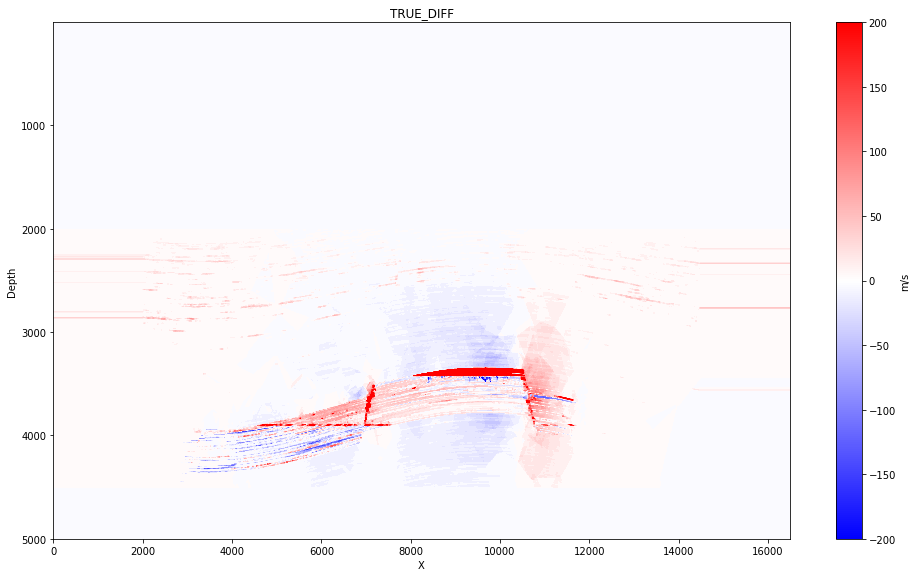

In [68]:
visual.vpmodel(TRUE_DIFF, cmap="bwr", vmin=-200, vmax=200)


2019-08-14 16:13:00.780961 	 Opening file /geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-CP00130-Vp.sgy...
2019-08-14 16:13:00.784006 	 Reading model...
2019-08-14 16:13:00.791424 	 Successfully loaded model of size 201 x 661!
2019-08-14 16:13:00.791893 	 Opening file /geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-CP00130-Vp.sgy...
2019-08-14 16:13:00.793030 	 Reading model...
2019-08-14 16:13:00.800046 	 Successfully loaded model of size 201 x 661!

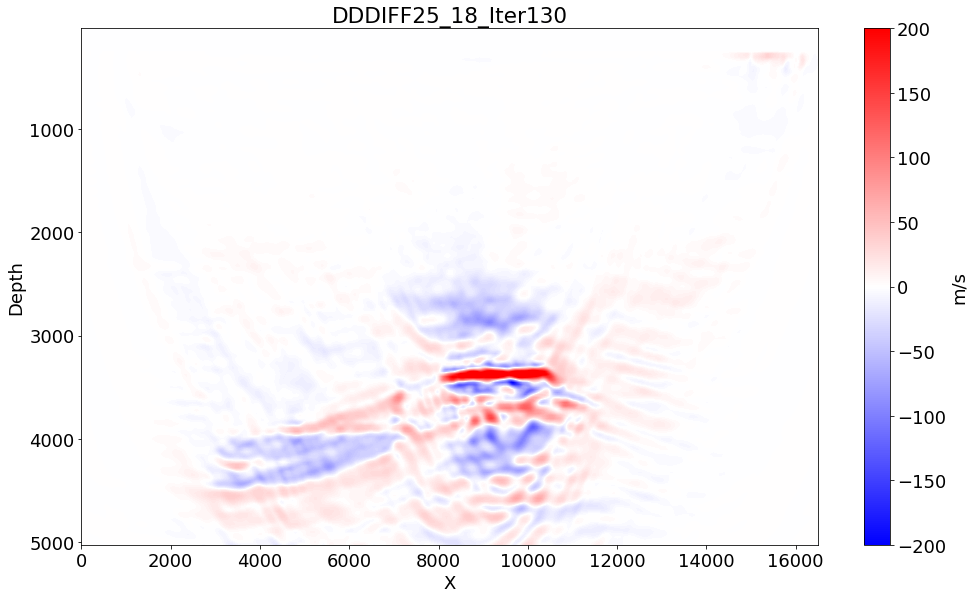

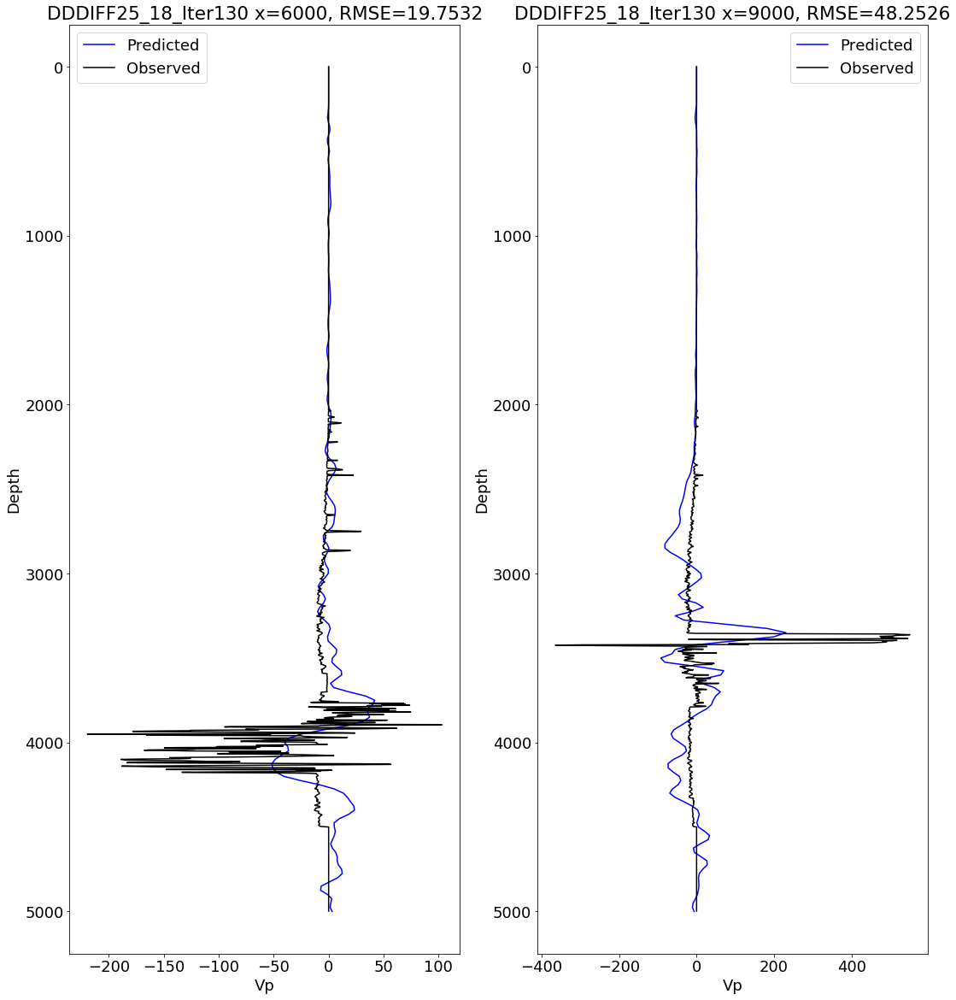

In [37]:
base_path = "/geophysics2/dpelacani/PROJECTS/PARBASE25_18/PARBASE25_18-CP" + format(130, "05") + "-Vp.sgy"
mon_path = "/geophysics2/dpelacani/PROJECTS/DDMON25_18/DDMON25_18-CP" + format(it, "05") + "-Vp.sgy"
CPBASE11 = tools.load(base_path, model=True, verbose=1)
CPMON11 = tools.load(mon_path, model=True, verbose=1)
CPDIFF11 = copy.deepcopy(CPBASE11)
CPDIFF11.name = "DDDIFF25_18_Iter%g" % it
CPDIFF11.data = CPMON11.data - CPBASE11.data

visual.vpmodel(CPDIFF11, cmap="bwr", vmin=-200, vmax=200)
_ = visual.vpwell(Model=CPDIFF11, pos_x=[6000, 9000], TrueModel=TRUE_DIFF, plot=True)